In [1]:
!pip install -q opencv-python-headless matplotlib seaborn


In [2]:
!pip install -q sahi==0.11.18 ultralytics


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.6/113.6 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 22.8 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 MB 27.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.8 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.6 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 84.2 MB/s eta 0:00:0

In [3]:
# 1. Import thư viện

import cv2
import os
import random
import shutil
import xml.etree.ElementTree as ET
from glob import glob
from sahi import AutoDetectionModel
from sahi.predict import get_prediction, get_sliced_prediction, predict
from sahi.utils.yolov8 import download_yolov8n_model, download_yolov8m_model, download_yolov8l_model, download_yolov8x_model

In [4]:
# --- 2. Chuẩn bị Dataset ---
# Cấu hình
INPUT_IMAGE_DIR = "/kaggle/input/yellostickytrap/yellow-sticky-traps-dataset/images"
INPUT_ANNOTATION_DIR = "/kaggle/input/yellostickytrap/yellow-sticky-traps-dataset/annotations"
OUTPUT_DIR = "/kaggle/working/yolo_dataset"
CLASSES = {'MR': 0, 'NC': 1, 'WF': 2}
TRAIN_RATIO = 0.7
VAL_RATIO = 0.15
TEST_RATIO = 0.15
SEED = 42

# Tạo thư mục
for split in ['train', 'val', 'test']:
    os.makedirs(f"{OUTPUT_DIR}/images/{split}", exist_ok=True)
    os.makedirs(f"{OUTPUT_DIR}/labels/{split}", exist_ok=True)

def convert_annotation(xml_path, w, h):
    tree = ET.parse(xml_path)
    root = tree.getroot()
    lines = []
    for obj in root.findall('object'):
        cls_name = obj.find('name').text
        if cls_name not in CLASSES:
            continue
        cls_id = CLASSES[cls_name]
        bnd = obj.find('bndbox')
        xmin = int(bnd.find('xmin').text)
        ymin = int(bnd.find('ymin').text)
        xmax = int(bnd.find('xmax').text)
        ymax = int(bnd.find('ymax').text)
        xc = ((xmin + xmax) / 2) / w
        yc = ((ymin + ymax) / 2) / h
        bw = (xmax - xmin) / w
        bh = (ymax - ymin) / h
        lines.append(f"{cls_id} {xc:.6f} {yc:.6f} {bw:.6f} {bh:.6f}")
    return lines

# Chia và xử lý ảnh
image_paths = sorted(glob(f"{INPUT_IMAGE_DIR}/*.jpg"))
random.seed(SEED)
random.shuffle(image_paths)

n = len(image_paths)
train_end = int(n * TRAIN_RATIO)
val_end = train_end + int(n * VAL_RATIO)
splits = {
    'train': image_paths[:train_end],
    'val': image_paths[train_end:val_end],
    'test': image_paths[val_end:]
}

for split, paths in splits.items():
    for img_path in paths:
        name = os.path.basename(img_path)
        xml_path = os.path.join(INPUT_ANNOTATION_DIR, name.replace('.jpg', '.xml'))
        img = cv2.imread(img_path)
        if img is None or not os.path.exists(xml_path):
            continue
        h, w = img.shape[:2]
        labels = convert_annotation(xml_path, w, h)
        if not labels:
            continue
        shutil.copy(img_path, f"{OUTPUT_DIR}/images/{split}/{name}")
        with open(f"{OUTPUT_DIR}/labels/{split}/{name.replace('.jpg', '.txt')}", 'w') as f:
            f.write('\n'.join(labels))

print("✅ Dataset sẵn sàng")

# --- 3. Tạo file data.yaml ---
data_yaml = '''
train: /kaggle/working/yolo_dataset/images/train
val: /kaggle/working/yolo_dataset/images/val
test: /kaggle/working/yolo_dataset/images/test

nc: 3
names: ['MR', 'NC', 'WF']
'''
with open("/kaggle/working/data.yaml", "w") as f:
    f.write(data_yaml)



✅ Dataset sẵn sàng


In [5]:
# --- 4. Huấn luyện YOLOv8n ---
from ultralytics import YOLO
model = YOLO('yolov8n.pt')
model.train(
    data='/kaggle/working/data.yaml',
    epochs=150,
    imgsz=1024,
    project='/kaggle/working',
    name='exp_yolov8n',
    pretrained=True,
    device='cuda'
)



Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 22.4MB/s]


Ultralytics 8.3.132 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1024, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=exp_yolov8n, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrain

100%|██████████| 755k/755k [00:00<00:00, 4.57MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 19.4MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2348.5±682.8 MB/s, size: 2538.4 KB)


train: Scanning /kaggle/working/yolo_dataset/labels/train... 198 images, 0 backgrounds, 0 corrupt: 100%|██████████| 198/198 [00:00<00:00, 1008.26it/s]


train: New cache created: /kaggle/working/yolo_dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3068.8±2172.2 MB/s, size: 1696.0 KB)


val: Scanning /kaggle/working/yolo_dataset/labels/val... 42 images, 0 backgrounds, 0 corrupt: 100%|██████████| 42/42 [00:00<00:00, 793.08it/s]

val: New cache created: /kaggle/working/yolo_dataset/labels/val.cache


Plotting labels to /kaggle/working/exp_yolov8n/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 1024 train, 1024 val
Using 4 dataloader workers
Logging results to /kaggle/working/exp_yolov8n
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      9.48G       2.85      4.477      1.206        381       1024: 100%|██████████| 13/13 [00:33<00:00,  2.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.19s/it]

                   all         42       1112    0.00455     0.0925    0.00983    0.00235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150      9.96G      2.354      2.681     0.9976        202       1024: 100%|██████████| 13/13 [00:18<00:00,  1.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.84it/s]

                   all         42       1112     0.0159      0.259     0.0609     0.0123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150      9.91G      2.274      2.222          1        165       1024: 100%|██████████| 13/13 [00:18<00:00,  1.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.81it/s]

                   all         42       1112     0.0349      0.516      0.157     0.0449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150      10.1G      2.227      1.991      1.017        128       1024: 100%|██████████| 13/13 [00:14<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.69it/s]

                   all         42       1112     0.0423      0.648      0.304      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150      9.87G      2.141      1.788      1.012        262       1024: 100%|██████████| 13/13 [00:14<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  2.00it/s]

                   all         42       1112     0.0627      0.825      0.495      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150      8.86G       2.09      1.725     0.9975        416       1024: 100%|██████████| 13/13 [00:12<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.04it/s]

                   all         42       1112      0.672      0.343      0.533      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150      7.35G       2.09      1.657      0.983        589       1024: 100%|██████████| 13/13 [00:16<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.95it/s]

                   all         42       1112      0.596        0.5      0.562      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150      8.68G      2.024      1.659     0.9891        153       1024: 100%|██████████| 13/13 [00:14<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.00it/s]

                   all         42       1112      0.732      0.345       0.58      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150      9.27G      2.008      1.553      1.004        188       1024: 100%|██████████| 13/13 [00:16<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.46it/s]

                   all         42       1112      0.685      0.621      0.643      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150      8.89G      2.019      1.496     0.9874        158       1024: 100%|██████████| 13/13 [00:11<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.92it/s]

                   all         42       1112      0.648      0.577      0.611      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150      10.9G      2.019       1.54     0.9895        233       1024: 100%|██████████| 13/13 [00:14<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.85it/s]

                   all         42       1112      0.722      0.706      0.718      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150      10.4G          2      1.433     0.9954        160       1024: 100%|██████████| 13/13 [00:12<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.01it/s]

                   all         42       1112      0.729      0.722      0.741      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150      8.93G      2.036      1.373     0.9636        660       1024: 100%|██████████| 13/13 [00:15<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.31it/s]

                   all         42       1112      0.659      0.702      0.649      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150         7G      1.943      1.335     0.9829        296       1024: 100%|██████████| 13/13 [00:11<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]

                   all         42       1112      0.738      0.731      0.727      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150      8.21G      1.979      1.348     0.9767        379       1024: 100%|██████████| 13/13 [00:16<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.51it/s]

                   all         42       1112      0.758      0.761      0.772      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150      11.6G      2.004      1.302     0.9673        547       1024: 100%|██████████| 13/13 [00:16<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         42       1112      0.734       0.74      0.728      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150      9.11G          2      1.321     0.9943        155       1024: 100%|██████████| 13/13 [00:11<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.56it/s]

                   all         42       1112       0.72      0.704      0.722      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150      8.51G      1.919        1.3     0.9707        301       1024: 100%|██████████| 13/13 [00:13<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.83it/s]

                   all         42       1112       0.56      0.631      0.517      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150      8.49G      1.952       1.34     0.9711        283       1024: 100%|██████████| 13/13 [00:14<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.97it/s]

                   all         42       1112      0.768      0.788      0.788      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150      12.5G      2.031      1.282     0.9835        391       1024: 100%|██████████| 13/13 [00:14<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.83it/s]

                   all         42       1112      0.704      0.711      0.702      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150      9.15G      1.932      1.284     0.9639        129       1024: 100%|██████████| 13/13 [00:13<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.86it/s]

                   all         42       1112       0.75      0.798      0.798       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150      9.55G      1.978       1.23     0.9849        352       1024: 100%|██████████| 13/13 [00:14<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         42       1112      0.752       0.74      0.742      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150      7.37G      1.927       1.21     0.9671        194       1024: 100%|██████████| 13/13 [00:14<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.15it/s]

                   all         42       1112      0.702      0.756      0.739      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150      8.62G      1.943      1.202     0.9867        222       1024: 100%|██████████| 13/13 [00:13<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         42       1112      0.708      0.793      0.765      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150       8.1G      1.966      1.242     0.9956        458       1024: 100%|██████████| 13/13 [00:14<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.58it/s]

                   all         42       1112      0.741      0.744      0.742      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150      10.5G      1.943      1.191     0.9752        172       1024: 100%|██████████| 13/13 [00:15<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.15it/s]

                   all         42       1112      0.797      0.784      0.798      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150      9.73G      1.903       1.17     0.9552        173       1024: 100%|██████████| 13/13 [00:11<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]

                   all         42       1112      0.834      0.808      0.838      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150      9.15G      1.923      1.161     0.9785        184       1024: 100%|██████████| 13/13 [00:11<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         42       1112      0.804      0.824      0.845      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150       9.3G       1.92      1.146     0.9594        361       1024: 100%|██████████| 13/13 [00:16<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         42       1112      0.786      0.785       0.82      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150      9.62G      1.905       1.16     0.9651        130       1024: 100%|██████████| 13/13 [00:16<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.89it/s]

                   all         42       1112      0.765      0.731       0.76      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150      10.3G      1.885       1.11     0.9597        232       1024: 100%|██████████| 13/13 [00:13<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         42       1112      0.822      0.791      0.823      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150      10.9G      1.913      1.104     0.9606        385       1024: 100%|██████████| 13/13 [00:14<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.47it/s]

                   all         42       1112      0.744      0.786      0.788      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150      10.4G      1.914      1.098      0.945        338       1024: 100%|██████████| 13/13 [00:13<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.61it/s]

                   all         42       1112      0.743      0.736      0.753      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150      10.7G      1.905      1.096     0.9576        327       1024: 100%|██████████| 13/13 [00:14<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         42       1112      0.776      0.736      0.739      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150      10.2G      1.888       1.13     0.9706        155       1024: 100%|██████████| 13/13 [00:12<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         42       1112      0.799      0.814      0.819      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150        12G      1.939       1.12     0.9715        275       1024: 100%|██████████| 13/13 [00:17<00:00,  1.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]

                   all         42       1112      0.818      0.796      0.832      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150        11G      1.891      1.111     0.9603        138       1024: 100%|██████████| 13/13 [00:15<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.73it/s]

                   all         42       1112      0.828      0.823       0.85      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150      10.6G      1.856      1.072     0.9587        193       1024: 100%|██████████| 13/13 [00:12<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.29it/s]

                   all         42       1112      0.844      0.827      0.856      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150      8.83G      1.884      1.054     0.9575        133       1024: 100%|██████████| 13/13 [00:15<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.56it/s]

                   all         42       1112      0.839      0.802      0.843      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150      6.66G      1.918      1.118     0.9523        281       1024: 100%|██████████| 13/13 [00:14<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.52it/s]

                   all         42       1112      0.782      0.721      0.774       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150      10.2G      1.886      1.073     0.9556        177       1024: 100%|██████████| 13/13 [00:14<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         42       1112      0.795      0.804      0.828      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      7.71G      1.842      1.061     0.9511        283       1024: 100%|██████████| 13/13 [00:14<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.63it/s]

                   all         42       1112      0.787      0.789       0.81      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150      10.8G      1.888      1.099     0.9599        220       1024: 100%|██████████| 13/13 [00:12<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]

                   all         42       1112      0.794      0.778      0.807      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150      10.7G      1.868      1.053     0.9649        222       1024: 100%|██████████| 13/13 [00:14<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.57it/s]

                   all         42       1112      0.831      0.834      0.846      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150      10.1G      1.889       1.05     0.9659        366       1024: 100%|██████████| 13/13 [00:12<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]

                   all         42       1112      0.811      0.831       0.83      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150      10.3G       1.84       1.08      0.949         99       1024: 100%|██████████| 13/13 [00:15<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]

                   all         42       1112      0.821      0.815      0.839      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150      10.3G      1.894      1.019     0.9501        401       1024: 100%|██████████| 13/13 [00:16<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.72it/s]

                   all         42       1112      0.848       0.82      0.857      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150      6.55G      1.834      1.017     0.9541        236       1024: 100%|██████████| 13/13 [00:13<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         42       1112      0.828      0.817      0.852      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150      8.44G      1.891      1.045     0.9582        256       1024: 100%|██████████| 13/13 [00:14<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]

                   all         42       1112      0.827       0.82      0.849      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150       9.5G      1.827      1.021     0.9421        318       1024: 100%|██████████| 13/13 [00:14<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         42       1112      0.846       0.83      0.857      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150      8.11G      1.847      1.017     0.9575        298       1024: 100%|██████████| 13/13 [00:14<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.74it/s]

                   all         42       1112      0.849      0.851      0.876      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150      8.27G       1.79      1.013     0.9522        173       1024: 100%|██████████| 13/13 [00:13<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         42       1112      0.783      0.772      0.801      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      6.91G      1.865      1.015     0.9494        228       1024: 100%|██████████| 13/13 [00:11<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         42       1112       0.81      0.854      0.855      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150       9.3G      1.846      1.023     0.9411        294       1024: 100%|██████████| 13/13 [00:16<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.81it/s]

                   all         42       1112      0.833      0.826      0.857      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150      8.54G      1.817     0.9945      0.958        151       1024: 100%|██████████| 13/13 [00:14<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.77it/s]

                   all         42       1112      0.803      0.813       0.84       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      7.31G      1.813     0.9835     0.9451        395       1024: 100%|██████████| 13/13 [00:12<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.54it/s]

                   all         42       1112       0.84      0.832      0.869      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150      8.59G       1.82     0.9639      0.949        205       1024: 100%|██████████| 13/13 [00:15<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         42       1112      0.813      0.804      0.853       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150      11.5G      1.855     0.9911     0.9501        287       1024: 100%|██████████| 13/13 [00:13<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]

                   all         42       1112      0.757      0.745      0.788      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150      9.75G      1.853     0.9882     0.9482        280       1024: 100%|██████████| 13/13 [00:16<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]

                   all         42       1112      0.815      0.792      0.832      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150      7.99G      1.826     0.9926     0.9513        272       1024: 100%|██████████| 13/13 [00:13<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.81it/s]

                   all         42       1112      0.841      0.815       0.87      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150       8.5G      1.795     0.9558     0.9455        416       1024: 100%|██████████| 13/13 [00:12<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.11it/s]

                   all         42       1112      0.856      0.821      0.871      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150      9.51G      1.808     0.9945     0.9534        186       1024: 100%|██████████| 13/13 [00:14<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         42       1112      0.855      0.813      0.855       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150      7.89G      1.785     0.9601     0.9558        252       1024: 100%|██████████| 13/13 [00:12<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.59it/s]

                   all         42       1112      0.833      0.812      0.856      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150      8.55G      1.814      0.979     0.9526        219       1024: 100%|██████████| 13/13 [00:18<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]

                   all         42       1112      0.858      0.861      0.885      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150      8.24G      1.809     0.9565     0.9494        196       1024: 100%|██████████| 13/13 [00:14<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         42       1112      0.852       0.84      0.868      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150      9.71G      1.827     0.9796     0.9401        121       1024: 100%|██████████| 13/13 [00:14<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.86it/s]

                   all         42       1112       0.84      0.815      0.855      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150      9.24G      1.869      1.008     0.9573        242       1024: 100%|██████████| 13/13 [00:12<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         42       1112      0.829      0.833      0.841       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150      10.2G       1.81     0.9574     0.9319        419       1024: 100%|██████████| 13/13 [00:13<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.42it/s]

                   all         42       1112      0.799      0.872      0.854      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150      9.08G      1.813     0.9561     0.9512        242       1024: 100%|██████████| 13/13 [00:13<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]

                   all         42       1112      0.824      0.856       0.85      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150      9.53G      1.844      0.968      0.937        322       1024: 100%|██████████| 13/13 [00:14<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         42       1112      0.801      0.816      0.822      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150      10.4G      1.845     0.9353      0.953        545       1024: 100%|██████████| 13/13 [00:14<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.67it/s]

                   all         42       1112      0.822      0.842      0.849      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150      11.9G      1.833     0.9384     0.9469        698       1024: 100%|██████████| 13/13 [00:17<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.45it/s]

                   all         42       1112      0.839      0.837      0.869      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150      10.1G      1.803     0.9124     0.9533        182       1024: 100%|██████████| 13/13 [00:09<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.63it/s]

                   all         42       1112       0.81      0.841      0.868      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150      8.29G      1.802      0.912       0.95        160       1024: 100%|██████████| 13/13 [00:17<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         42       1112      0.838      0.847      0.878      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150      10.1G       1.75     0.8832     0.9395        364       1024: 100%|██████████| 13/13 [00:12<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         42       1112      0.806       0.82      0.846      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150      8.11G       1.75     0.8829     0.9386        236       1024: 100%|██████████| 13/13 [00:13<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.84it/s]

                   all         42       1112      0.815      0.822      0.845      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150       9.9G      1.771     0.9041     0.9387        170       1024: 100%|██████████| 13/13 [00:14<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         42       1112      0.797      0.805      0.816       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150      7.59G      1.804     0.9445     0.9385        174       1024: 100%|██████████| 13/13 [00:12<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all         42       1112      0.845       0.86      0.877      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150      7.24G      1.777     0.9227     0.9363        526       1024: 100%|██████████| 13/13 [00:11<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         42       1112      0.778      0.816      0.839      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150      8.55G      1.782     0.9146     0.9371        431       1024: 100%|██████████| 13/13 [00:18<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.15it/s]

                   all         42       1112      0.846      0.846      0.871      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150      12.1G      1.797     0.9435     0.9499        160       1024: 100%|██████████| 13/13 [00:13<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         42       1112      0.851      0.836       0.88      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150      9.32G      1.781     0.9207      0.936        377       1024: 100%|██████████| 13/13 [00:13<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all         42       1112      0.841      0.828      0.874       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150      8.31G      1.768     0.9003      0.933        445       1024: 100%|██████████| 13/13 [00:15<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.74it/s]

                   all         42       1112      0.834      0.832      0.853      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150      11.2G      1.763      0.892     0.9279        248       1024: 100%|██████████| 13/13 [00:10<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]

                   all         42       1112      0.835      0.837      0.853      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150      12.5G      1.767     0.8965     0.9346        281       1024: 100%|██████████| 13/13 [00:15<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         42       1112      0.853      0.863      0.873      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150      10.5G      1.769     0.8745     0.9223        385       1024: 100%|██████████| 13/13 [00:14<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]

                   all         42       1112      0.879      0.843      0.882      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150      9.11G      1.728      0.853     0.9365        229       1024: 100%|██████████| 13/13 [00:13<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         42       1112      0.826      0.836      0.843       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150      8.63G      1.722     0.8725     0.9377        171       1024: 100%|██████████| 13/13 [00:13<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         42       1112      0.835      0.845      0.863      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150      9.37G      1.745     0.8656     0.9331        285       1024: 100%|██████████| 13/13 [00:16<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         42       1112      0.797      0.801      0.839      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150      9.63G      1.773     0.8705     0.9315        278       1024: 100%|██████████| 13/13 [00:13<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         42       1112      0.829      0.836      0.867      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150      8.43G      1.771     0.8808     0.9427        228       1024: 100%|██████████| 13/13 [00:13<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         42       1112      0.866      0.848      0.885       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150       7.9G      1.765     0.9064     0.9406        739       1024: 100%|██████████| 13/13 [00:14<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.77it/s]

                   all         42       1112      0.797      0.763      0.775      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150      12.8G      1.734     0.8548     0.9262        320       1024: 100%|██████████| 13/13 [00:16<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.65it/s]

                   all         42       1112      0.785      0.828      0.816      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150      8.63G      1.704     0.8578     0.9353        364       1024: 100%|██████████| 13/13 [00:13<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         42       1112      0.823       0.85      0.848      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150      8.62G      1.727     0.8561     0.9356        369       1024: 100%|██████████| 13/13 [00:12<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.42it/s]

                   all         42       1112      0.818      0.838      0.858      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150      8.14G      1.777     0.8571     0.9328        399       1024: 100%|██████████| 13/13 [00:16<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.29it/s]

                   all         42       1112      0.843      0.841      0.871      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150      8.38G      1.744     0.8773     0.9379        222       1024: 100%|██████████| 13/13 [00:14<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.77it/s]

                   all         42       1112      0.836      0.842      0.854        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150      10.6G      1.731     0.8541     0.9206        375       1024: 100%|██████████| 13/13 [00:14<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.63it/s]

                   all         42       1112      0.841       0.84       0.87      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150      12.4G       1.78      0.883     0.9369        166       1024: 100%|██████████| 13/13 [00:12<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.76it/s]

                   all         42       1112      0.834      0.861      0.879      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150       9.4G      1.713     0.8452     0.9385        284       1024: 100%|██████████| 13/13 [00:14<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.29it/s]

                   all         42       1112      0.887      0.873      0.899       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150      10.2G      1.723      0.854     0.9257        320       1024: 100%|██████████| 13/13 [00:13<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         42       1112      0.876      0.871      0.895      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/150      11.8G      1.732     0.8513     0.9318        257       1024: 100%|██████████| 13/13 [00:14<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.74it/s]

                   all         42       1112      0.839      0.848      0.864      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/150      10.1G       1.73     0.8585      0.929        563       1024: 100%|██████████| 13/13 [00:12<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         42       1112      0.825      0.835      0.852      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/150      7.61G      1.716     0.8396     0.9255        241       1024: 100%|██████████| 13/13 [00:16<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         42       1112      0.863      0.874      0.884       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/150      7.66G       1.68      0.841     0.9357        287       1024: 100%|██████████| 13/13 [00:14<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.98it/s]

                   all         42       1112      0.848      0.862      0.864      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/150      10.8G      1.703      0.842     0.9402        135       1024: 100%|██████████| 13/13 [00:13<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.57it/s]

                   all         42       1112      0.831      0.854      0.874      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/150        12G       1.72     0.8294     0.9268        360       1024: 100%|██████████| 13/13 [00:16<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.89it/s]

                   all         42       1112      0.858      0.857      0.877       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/150      9.81G      1.701     0.8239     0.9111        367       1024: 100%|██████████| 13/13 [00:12<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]

                   all         42       1112      0.865      0.854      0.871      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/150      7.81G      1.719     0.8463     0.9255        156       1024: 100%|██████████| 13/13 [00:17<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]

                   all         42       1112      0.846      0.861      0.879      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/150      9.99G      1.706     0.8238     0.9292        304       1024: 100%|██████████| 13/13 [00:15<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.61it/s]

                   all         42       1112      0.846      0.869      0.881      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/150      8.57G      1.696     0.8282     0.9157        207       1024: 100%|██████████| 13/13 [00:11<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         42       1112      0.871      0.863      0.883      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/150      10.3G        1.7     0.8044     0.9243        358       1024: 100%|██████████| 13/13 [00:15<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         42       1112      0.847       0.86      0.875      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/150      10.8G      1.698     0.8327     0.9199        300       1024: 100%|██████████| 13/13 [00:12<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]

                   all         42       1112      0.837      0.856      0.872      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/150      9.01G      1.697     0.8218     0.9122        263       1024: 100%|██████████| 13/13 [00:16<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.75it/s]

                   all         42       1112      0.852      0.838      0.863      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/150      10.7G      1.674     0.8057      0.917        376       1024: 100%|██████████| 13/13 [00:11<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         42       1112      0.853      0.847      0.881        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/150      9.39G      1.694     0.8181     0.9062        303       1024: 100%|██████████| 13/13 [00:13<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         42       1112      0.853      0.854       0.87      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/150      11.6G      1.698     0.8127     0.9193        252       1024: 100%|██████████| 13/13 [00:14<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.60it/s]

                   all         42       1112      0.861      0.853      0.874      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/150      10.3G      1.654     0.8062     0.9069        347       1024: 100%|██████████| 13/13 [00:13<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         42       1112      0.855      0.866      0.884        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/150      9.97G      1.676     0.7968     0.9203        364       1024: 100%|██████████| 13/13 [00:14<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]

                   all         42       1112      0.846      0.881       0.88      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/150      7.82G      1.698     0.8128     0.9096        336       1024: 100%|██████████| 13/13 [00:15<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]

                   all         42       1112      0.871      0.864      0.889      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/150      9.37G      1.623     0.7748     0.9106        325       1024: 100%|██████████| 13/13 [00:14<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.52it/s]

                   all         42       1112      0.859      0.864      0.888      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/150      13.1G      1.686     0.8036       0.92        245       1024: 100%|██████████| 13/13 [00:14<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]

                   all         42       1112      0.834      0.863      0.881      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/150      10.9G      1.677     0.7934     0.9152        273       1024: 100%|██████████| 13/13 [00:14<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]

                   all         42       1112      0.848      0.853      0.874      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/150      10.4G      1.667     0.7843     0.9292        365       1024: 100%|██████████| 13/13 [00:12<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         42       1112      0.861      0.856      0.882      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/150      10.5G      1.667     0.7839     0.9207        493       1024: 100%|██████████| 13/13 [00:15<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.74it/s]

                   all         42       1112       0.86      0.861      0.879      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/150      8.78G      1.647     0.7815     0.9069        493       1024: 100%|██████████| 13/13 [00:11<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]

                   all         42       1112      0.843       0.85      0.856      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/150      9.52G      1.681     0.7981     0.9188        164       1024: 100%|██████████| 13/13 [00:14<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         42       1112      0.861      0.839      0.857      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/150      9.44G      1.658     0.7915     0.9235        296       1024: 100%|██████████| 13/13 [00:13<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.88it/s]

                   all         42       1112      0.876      0.852      0.868      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/150      9.59G      1.636     0.7848     0.9129        173       1024: 100%|██████████| 13/13 [00:15<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.89it/s]

                   all         42       1112      0.852      0.839      0.859      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/150       8.6G      1.624     0.7887     0.9192        236       1024: 100%|██████████| 13/13 [00:14<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         42       1112      0.851       0.83      0.857      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/150      7.63G      1.667     0.7893      0.919        346       1024: 100%|██████████| 13/13 [00:14<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

                   all         42       1112      0.861      0.853      0.878      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/150      9.29G       1.66     0.7961     0.9148        418       1024: 100%|██████████| 13/13 [00:13<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.50it/s]

                   all         42       1112      0.855      0.848      0.874      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/150      8.35G       1.63     0.7623      0.912        232       1024: 100%|██████████| 13/13 [00:11<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]

                   all         42       1112      0.851       0.87      0.877      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/150       9.6G      1.651     0.7776     0.8988        441       1024: 100%|██████████| 13/13 [00:12<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         42       1112      0.847      0.865      0.873      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/150      9.57G      1.659     0.7897     0.9014        139       1024: 100%|██████████| 13/13 [00:12<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         42       1112      0.854      0.852      0.869      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/150      10.3G      1.636     0.7746     0.9107        269       1024: 100%|██████████| 13/13 [00:14<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.75it/s]

                   all         42       1112      0.866      0.867      0.877       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/150      10.5G       1.64     0.7728     0.9098        384       1024: 100%|██████████| 13/13 [00:11<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         42       1112      0.864      0.866      0.885      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/150      8.88G      1.592      0.756     0.9126        207       1024: 100%|██████████| 13/13 [00:15<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         42       1112      0.855       0.87      0.878      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/150      7.48G      1.629     0.7876      0.913        255       1024: 100%|██████████| 13/13 [00:15<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         42       1112      0.854      0.866      0.873      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/150      10.2G      1.637     0.7924     0.9051        189       1024: 100%|██████████| 13/13 [00:16<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.91it/s]

                   all         42       1112      0.853      0.857      0.872      0.402


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/150      6.95G      1.582     0.7789     0.9238        188       1024: 100%|██████████| 13/13 [00:26<00:00,  2.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.84it/s]

                   all         42       1112      0.842      0.864      0.865      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/150      9.12G       1.62     0.7715     0.9224        134       1024: 100%|██████████| 13/13 [00:24<00:00,  1.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.79it/s]

                   all         42       1112      0.853      0.861      0.874      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/150      7.89G      1.596     0.7533     0.9023        153       1024: 100%|██████████| 13/13 [00:16<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         42       1112      0.845      0.869      0.877      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/150      8.46G      1.571     0.7418     0.9144        164       1024: 100%|██████████| 13/13 [00:14<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.68it/s]

                   all         42       1112      0.845      0.854      0.866      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/150      9.21G      1.601     0.7776     0.9091        137       1024: 100%|██████████| 13/13 [00:13<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.50it/s]

                   all         42       1112      0.838      0.857      0.858      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/150      7.89G       1.56     0.7376     0.9125        162       1024: 100%|██████████| 13/13 [00:12<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         42       1112      0.834       0.85       0.86      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/150      8.94G      1.563     0.7468     0.9172        197       1024: 100%|██████████| 13/13 [00:15<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.82it/s]

                   all         42       1112      0.841      0.853      0.864        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/150      9.23G      1.594     0.7719     0.9169        142       1024: 100%|██████████| 13/13 [00:15<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         42       1112      0.834      0.858      0.866      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/150      6.98G      1.569     0.7503     0.9157        162       1024: 100%|██████████| 13/13 [00:13<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         42       1112      0.839      0.859       0.87      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/150      8.16G      1.571     0.7407       0.91        319       1024: 100%|██████████| 13/13 [00:14<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.92it/s]

                   all         42       1112      0.842      0.864      0.872      0.406



150 epochs completed in 0.705 hours.
Optimizer stripped from /kaggle/working/exp_yolov8n/weights/last.pt, 6.3MB
Optimizer stripped from /kaggle/working/exp_yolov8n/weights/best.pt, 6.3MB

Validating /kaggle/working/exp_yolov8n/weights/best.pt...
Ultralytics 8.3.132 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.31it/s]


                   all         42       1112      0.885      0.874      0.898      0.421
                    MR         25        234      0.883      0.867      0.876      0.372
                    NC         15        133       0.95      0.977       0.99      0.547
                    WF         24        745      0.823      0.778      0.829      0.345


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.3ms preprocess, 3.7ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to /kaggle/working/exp_yolov8n


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d8257116990>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

In [30]:
from ultralytics import YOLO

# Load mô hình tốt nhất đã train xong
model = YOLO('/kaggle/working/exp_yolov8n/weights/best.pt')

# Đánh giá trên tập test (được chỉ định trong data.yaml)
metrics = model.val(
    data='/kaggle/working/data.yaml',
    split='test',
    save=True,         # lưu ảnh + kết quả
    save_json=True     # lưu file predictions.json để đánh giá mAP
)

Ultralytics 8.3.132 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2498.4±1039.8 MB/s, size: 2621.4 KB)


val: Scanning /kaggle/working/yolo_dataset/labels/test.cache... 44 images, 0 backgrounds, 0 corrupt: 100%|██████████| 44/44 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.31s/it]


                   all         44        967      0.873      0.869      0.894      0.423
                    MR         30        334      0.871       0.87       0.89      0.386
                    NC         19        120      0.939      0.898      0.972      0.545
                    WF         24        513      0.809      0.838      0.818      0.338


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 11.0ms preprocess, 9.3ms inference, 0.0ms loss, 2.8ms postprocess per image
Saving runs/detect/val3/predictions.json...
Results saved to runs/detect/val3


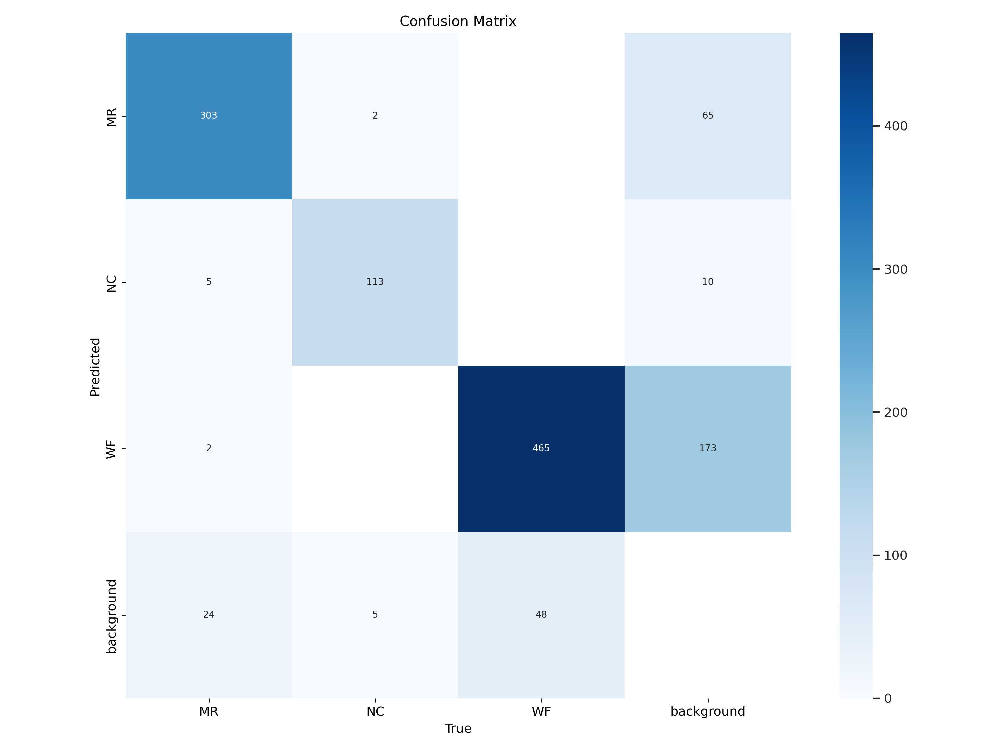

In [31]:
from IPython.display import Image, display
import os

# Đường dẫn tới ảnh đã được SAHI xử lý và vẽ box
img_path = "/kaggle/working/runs/detect/val3/confusion_matrix.png" 
display(Image(filename=img_path))



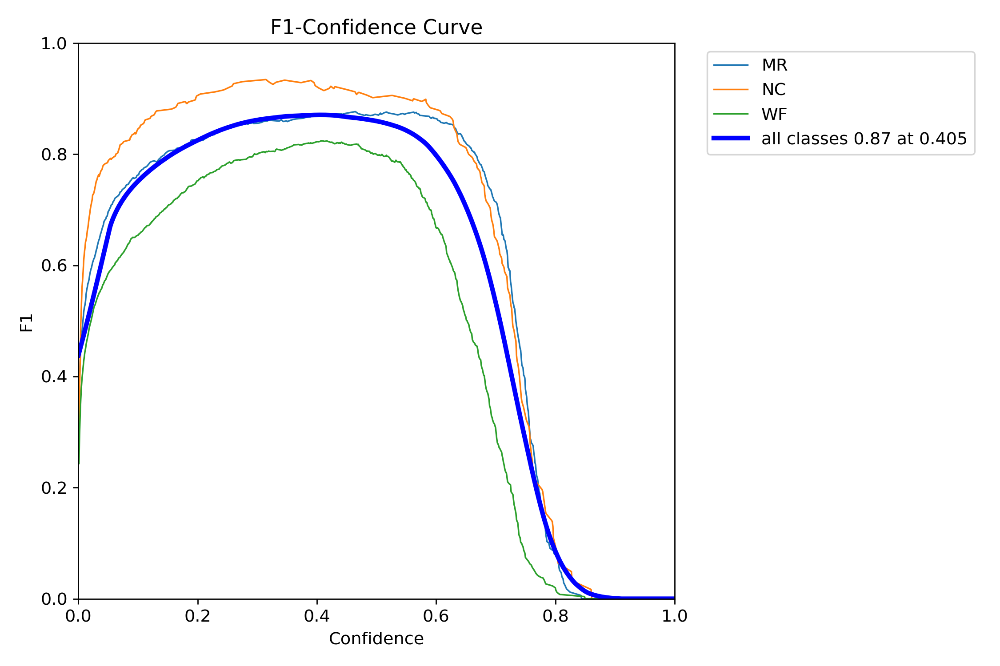

In [32]:
img_path = "/kaggle/working/runs/detect/val3/F1_curve.png" 
display(Image(filename=img_path))


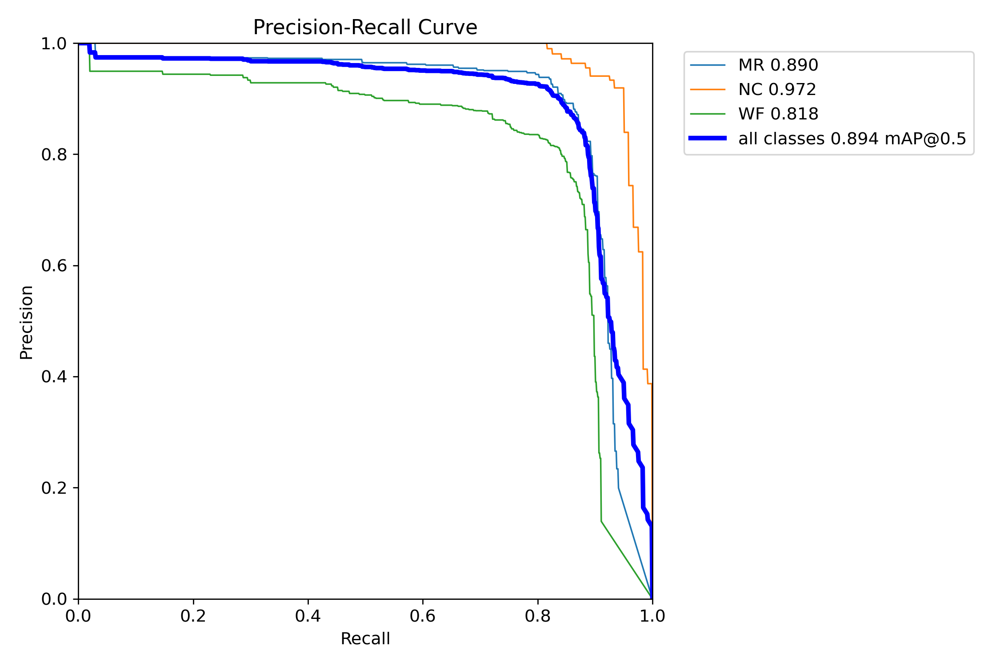

In [33]:
img_path = "/kaggle/working/runs/detect/val3/PR_curve.png" 
display(Image(filename=img_path))


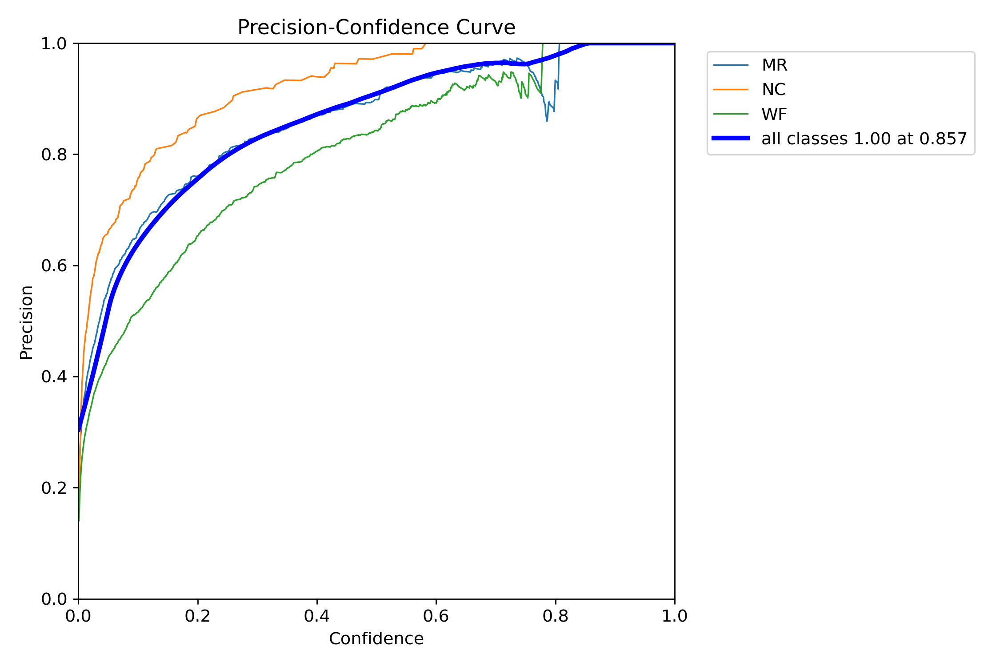

In [34]:
img_path = "/kaggle/working/runs/detect/val3/P_curve.png" 
display(Image(filename=img_path))


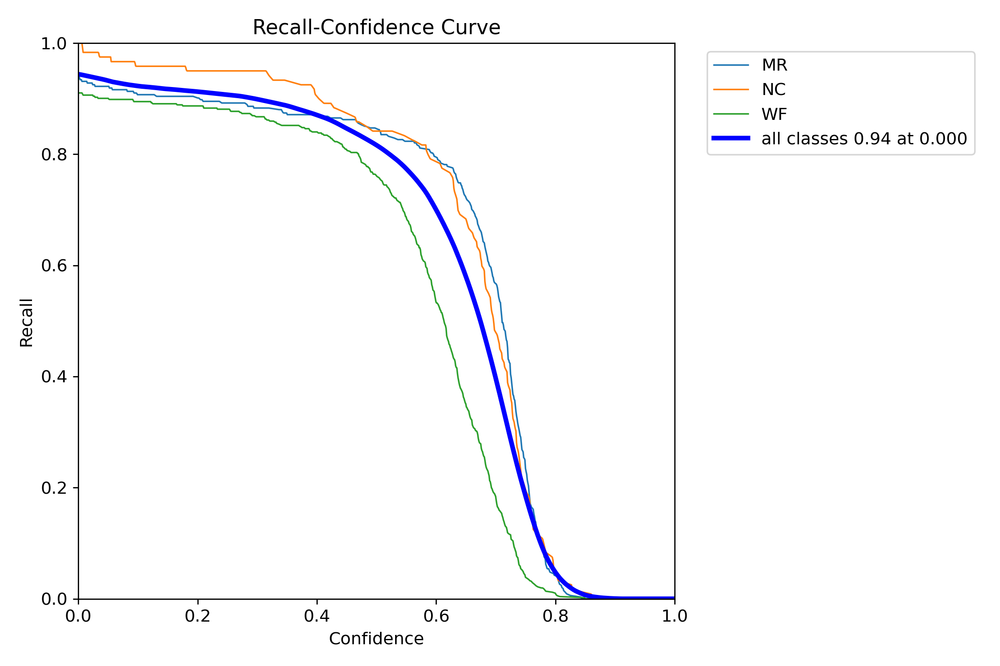

In [37]:
img_path = "/kaggle/working/runs/detect/val3/R_curve.png" 
display(Image(filename=img_path))


In [10]:
results = model.predict(
    source='/kaggle/working/yolo_dataset/images/test',  # thư mục chứa ảnh test
    conf=0.5,           # confidence threshold
    save=True,          # lưu ảnh kết quả có bbox
    save_txt=True,      
    project='runs/yolov8n',
    name='predict_test',
    imgsz=1024,
    device='cuda'       # hoặc 'cpu' nếu không có GPU
)



image 1/44 /kaggle/working/yolo_dataset/images/test/1003.jpg: 704x1024 9 MRs, 54 WFs, 11.2ms
image 2/44 /kaggle/working/yolo_dataset/images/test/1011.jpg: 704x1024 4 MRs, 10.6ms
image 3/44 /kaggle/working/yolo_dataset/images/test/1012.jpg: 704x1024 4 MRs, 10.7ms
image 4/44 /kaggle/working/yolo_dataset/images/test/1013.jpg: 704x1024 8 MRs, 10.6ms
image 5/44 /kaggle/working/yolo_dataset/images/test/1015.jpg: 704x1024 7 MRs, 10.6ms
image 6/44 /kaggle/working/yolo_dataset/images/test/1016.jpg: 704x1024 10 MRs, 10.7ms
image 7/44 /kaggle/working/yolo_dataset/images/test/1023.jpg: 704x1024 3 MRs, 2 NCs, 2 WFs, 10.6ms
image 8/44 /kaggle/working/yolo_dataset/images/test/1024.jpg: 704x1024 10 MRs, 10.7ms
image 9/44 /kaggle/working/yolo_dataset/images/test/1026.jpg: 704x1024 6 NCs, 10.6ms
image 10/44 /kaggle/working/yolo_dataset/images/test/1031.jpg: 704x1024 11 NCs, 10.7ms
image 11/44 /kaggle/working/yolo_dataset/images/test/1044.jpg: 704x1024 3 NCs, 10.6ms
image 12/44 /kaggle/working/yolo_data

📷 Hiển thị ảnh đã xử lý: 1012.jpg


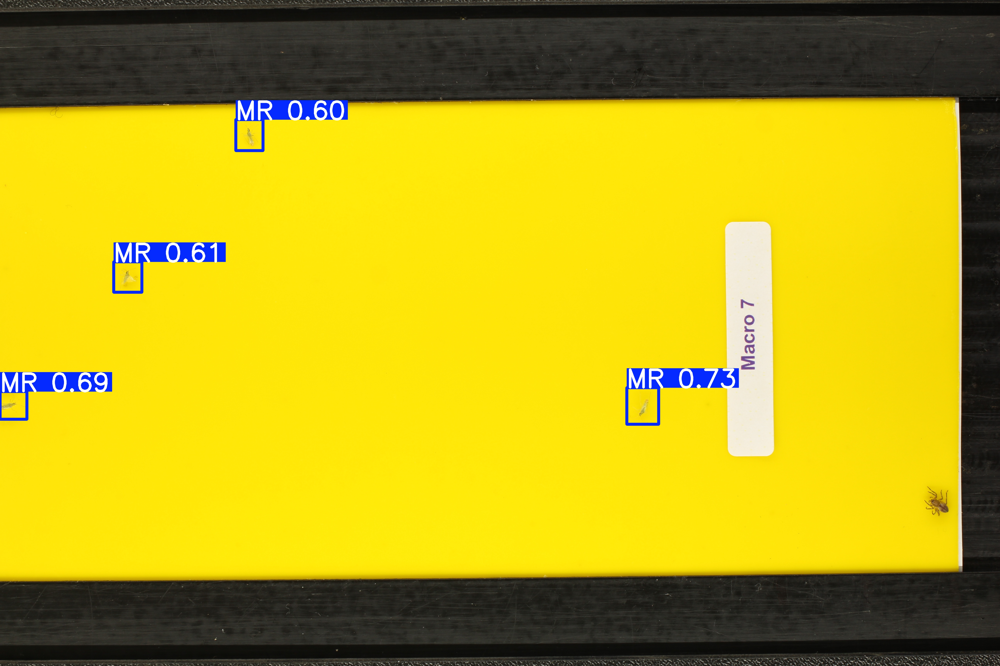

In [55]:
from IPython.display import Image, display
import os

# Đường dẫn tới ảnh đã được SAHI xử lý và vẽ box
img_path = "/kaggle/working/runs/yolov8n/predict_test/1012.jpg" 

if os.path.exists(img_path):
    print(f"📷 Hiển thị ảnh đã xử lý: {os.path.basename(img_path)}")
    display(Image(filename=img_path))
else:
    print("❌ Ảnh không tồn tại. Kiểm tra lại tên và đường dẫn.")


# KẾT HỢP YOLOV8N VỚI SAHI

In [6]:
from sahi.predict import predict
from sahi.utils.yolov8 import download_yolov8s_model
from sahi import AutoDetectionModel



best_model_path = '/kaggle/working/exp_yolov8n/weights/best.pt'

detection_model = AutoDetectionModel.from_pretrained(
    model_type='yolov8',
    model_path='/kaggle/working/exp_yolov8n/weights/best.pt',
    confidence_threshold=0.75,
    device='cuda',
)

predict(
    model_type='yolov8',
    model_path=best_model_path,
    source='/kaggle/working/yolo_dataset/images/test',
    slice_height=128,
    slice_width=128,
    overlap_height_ratio=0.2,
    overlap_width_ratio=0.2,
    postprocess_type="NMS",  # loại bỏ box trùng nhau
    postprocess_match_metric="IOU",
    postprocess_match_threshold=0.7,  # ngưỡng IOU để gộp box
    project='runs/sahi',
    name='sahi_predict',
)

There are 44 listed files in folder: test/


Performing inference on images:   0%|          | 0/44 [00:00<?, ?it/s]

Performing prediction on 1734 slices.


Performing inference on images:   0%|          | 0/44 [00:23<?, ?it/s]

Prediction time is: 23177.20 ms


Performing inference on images:   2%|▏         | 1/44 [00:24<17:20, 24.20s/it]

Performing prediction on 1734 slices.


Performing inference on images:   2%|▏         | 1/44 [00:47<17:20, 24.20s/it]

Prediction time is: 23192.79 ms


Performing inference on images:   5%|▍         | 2/44 [00:48<16:56, 24.21s/it]

Performing prediction on 1734 slices.


Performing inference on images:   5%|▍         | 2/44 [01:11<16:56, 24.21s/it]

Prediction time is: 23013.98 ms


Performing inference on images:   7%|▋         | 3/44 [01:12<16:27, 24.09s/it]

Performing prediction on 1734 slices.


Performing inference on images:   7%|▋         | 3/44 [01:35<16:27, 24.09s/it]

Prediction time is: 22961.60 ms


Performing inference on images:   9%|▉         | 4/44 [01:36<16:00, 24.01s/it]

Performing prediction on 1734 slices.


Performing inference on images:   9%|▉         | 4/44 [01:59<16:00, 24.01s/it]

Prediction time is: 22966.32 ms


Performing inference on images:  11%|█▏        | 5/44 [02:00<15:34, 23.96s/it]

Performing prediction on 1734 slices.


Performing inference on images:  11%|█▏        | 5/44 [02:23<15:34, 23.96s/it]

Prediction time is: 23081.44 ms


Performing inference on images:  14%|█▎        | 6/44 [02:24<15:09, 23.95s/it]

Performing prediction on 1734 slices.


Performing inference on images:  14%|█▎        | 6/44 [02:47<15:09, 23.95s/it]

Prediction time is: 23185.34 ms


Performing inference on images:  16%|█▌        | 7/44 [02:48<14:47, 23.99s/it]

Performing prediction on 1734 slices.


Performing inference on images:  16%|█▌        | 7/44 [03:11<14:47, 23.99s/it]

Prediction time is: 23139.56 ms


Performing inference on images:  18%|█▊        | 8/44 [03:12<14:24, 24.02s/it]

Performing prediction on 1734 slices.


Performing inference on images:  18%|█▊        | 8/44 [03:35<14:24, 24.02s/it]

Prediction time is: 23022.81 ms


Performing inference on images:  20%|██        | 9/44 [03:36<13:59, 23.98s/it]

Performing prediction on 1734 slices.


Performing inference on images:  20%|██        | 9/44 [03:59<13:59, 23.98s/it]

Prediction time is: 23185.67 ms


Performing inference on images:  23%|██▎       | 10/44 [04:00<13:36, 24.01s/it]

Performing prediction on 1734 slices.


Performing inference on images:  23%|██▎       | 10/44 [04:23<13:36, 24.01s/it]

Prediction time is: 23083.98 ms


Performing inference on images:  25%|██▌       | 11/44 [04:24<13:12, 24.03s/it]

Performing prediction on 1734 slices.


Performing inference on images:  25%|██▌       | 11/44 [04:47<13:12, 24.03s/it]

Prediction time is: 23240.52 ms


Performing inference on images:  27%|██▋       | 12/44 [04:48<12:51, 24.10s/it]

Performing prediction on 1734 slices.


Performing inference on images:  27%|██▋       | 12/44 [05:11<12:51, 24.10s/it]

Prediction time is: 23138.84 ms


Performing inference on images:  30%|██▉       | 13/44 [05:12<12:26, 24.10s/it]

Performing prediction on 1734 slices.


Performing inference on images:  30%|██▉       | 13/44 [05:35<12:26, 24.10s/it]

Prediction time is: 23151.26 ms


Performing inference on images:  32%|███▏      | 14/44 [05:36<12:02, 24.09s/it]

Performing prediction on 1734 slices.


Performing inference on images:  32%|███▏      | 14/44 [05:59<12:02, 24.09s/it]

Prediction time is: 23013.40 ms


Performing inference on images:  34%|███▍      | 15/44 [06:00<11:36, 24.02s/it]

Performing prediction on 1734 slices.


Performing inference on images:  34%|███▍      | 15/44 [06:23<11:36, 24.02s/it]

Prediction time is: 23051.57 ms


Performing inference on images:  36%|███▋      | 16/44 [06:24<11:12, 24.02s/it]

Performing prediction on 1734 slices.


Performing inference on images:  36%|███▋      | 16/44 [06:47<11:12, 24.02s/it]

Prediction time is: 23119.73 ms


Performing inference on images:  39%|███▊      | 17/44 [06:48<10:48, 24.02s/it]

Performing prediction on 1734 slices.


Performing inference on images:  39%|███▊      | 17/44 [07:11<10:48, 24.02s/it]

Prediction time is: 22987.35 ms


Performing inference on images:  41%|████      | 18/44 [07:12<10:23, 23.97s/it]

Performing prediction on 1734 slices.


Performing inference on images:  41%|████      | 18/44 [07:35<10:23, 23.97s/it]

Prediction time is: 23144.55 ms


Performing inference on images:  43%|████▎     | 19/44 [07:36<09:59, 23.99s/it]

Performing prediction on 1734 slices.


Performing inference on images:  43%|████▎     | 19/44 [07:59<09:59, 23.99s/it]

Prediction time is: 23120.57 ms


Performing inference on images:  45%|████▌     | 20/44 [08:00<09:36, 24.02s/it]

Performing prediction on 1734 slices.


Performing inference on images:  45%|████▌     | 20/44 [08:23<09:36, 24.02s/it]

Prediction time is: 23039.45 ms


Performing inference on images:  48%|████▊     | 21/44 [08:24<09:11, 23.98s/it]

Performing prediction on 1734 slices.


Performing inference on images:  48%|████▊     | 21/44 [08:47<09:11, 23.98s/it]

Prediction time is: 23141.90 ms


Performing inference on images:  50%|█████     | 22/44 [08:48<08:48, 24.00s/it]

Performing prediction on 1734 slices.


Performing inference on images:  50%|█████     | 22/44 [09:11<08:48, 24.00s/it]

Prediction time is: 23168.17 ms


Performing inference on images:  52%|█████▏    | 23/44 [09:12<08:24, 24.02s/it]

Performing prediction on 1734 slices.


Performing inference on images:  52%|█████▏    | 23/44 [09:35<08:24, 24.02s/it]

Prediction time is: 23244.64 ms


Performing inference on images:  55%|█████▍    | 24/44 [09:36<08:01, 24.08s/it]

Performing prediction on 1734 slices.


Performing inference on images:  55%|█████▍    | 24/44 [10:00<08:01, 24.08s/it]

Prediction time is: 23137.92 ms


Performing inference on images:  57%|█████▋    | 25/44 [10:01<07:37, 24.07s/it]

Performing prediction on 1734 slices.


Performing inference on images:  57%|█████▋    | 25/44 [10:24<07:37, 24.07s/it]

Prediction time is: 23182.69 ms


Performing inference on images:  59%|█████▉    | 26/44 [10:25<07:13, 24.08s/it]

Performing prediction on 1734 slices.


Performing inference on images:  59%|█████▉    | 26/44 [10:48<07:13, 24.08s/it]

Prediction time is: 23160.39 ms


Performing inference on images:  61%|██████▏   | 27/44 [10:49<06:48, 24.05s/it]

Performing prediction on 1734 slices.


Performing inference on images:  61%|██████▏   | 27/44 [11:12<06:48, 24.05s/it]

Prediction time is: 23232.98 ms


Performing inference on images:  64%|██████▎   | 28/44 [11:13<06:25, 24.11s/it]

Performing prediction on 1734 slices.


Performing inference on images:  64%|██████▎   | 28/44 [11:36<06:25, 24.11s/it]

Prediction time is: 23215.45 ms


Performing inference on images:  66%|██████▌   | 29/44 [11:37<06:01, 24.13s/it]

Performing prediction on 1734 slices.


Performing inference on images:  66%|██████▌   | 29/44 [12:00<06:01, 24.13s/it]

Prediction time is: 23221.79 ms


Performing inference on images:  68%|██████▊   | 30/44 [12:01<05:38, 24.14s/it]

Performing prediction on 1734 slices.


Performing inference on images:  68%|██████▊   | 30/44 [12:24<05:38, 24.14s/it]

Prediction time is: 23178.85 ms


Performing inference on images:  70%|███████   | 31/44 [12:25<05:13, 24.12s/it]

Performing prediction on 1734 slices.


Performing inference on images:  70%|███████   | 31/44 [12:48<05:13, 24.12s/it]

Prediction time is: 23147.52 ms


Performing inference on images:  73%|███████▎  | 32/44 [12:49<04:49, 24.13s/it]

Performing prediction on 1734 slices.


Performing inference on images:  73%|███████▎  | 32/44 [13:13<04:49, 24.13s/it]

Prediction time is: 23131.22 ms


Performing inference on images:  75%|███████▌  | 33/44 [13:14<04:25, 24.13s/it]

Performing prediction on 1734 slices.


Performing inference on images:  75%|███████▌  | 33/44 [13:37<04:25, 24.13s/it]

Prediction time is: 23233.49 ms


Performing inference on images:  77%|███████▋  | 34/44 [13:38<04:01, 24.18s/it]

Performing prediction on 1734 slices.


Performing inference on images:  77%|███████▋  | 34/44 [14:01<04:01, 24.18s/it]

Prediction time is: 23232.38 ms


Performing inference on images:  80%|███████▉  | 35/44 [14:02<03:37, 24.14s/it]

Performing prediction on 1734 slices.


Performing inference on images:  80%|███████▉  | 35/44 [14:25<03:37, 24.14s/it]

Prediction time is: 23255.02 ms


Performing inference on images:  82%|████████▏ | 36/44 [14:26<03:13, 24.13s/it]

Performing prediction on 1734 slices.


Performing inference on images:  82%|████████▏ | 36/44 [14:49<03:13, 24.13s/it]

Prediction time is: 23135.74 ms


Performing inference on images:  84%|████████▍ | 37/44 [14:50<02:48, 24.10s/it]

Performing prediction on 1734 slices.


Performing inference on images:  84%|████████▍ | 37/44 [15:13<02:48, 24.10s/it]

Prediction time is: 23079.32 ms


Performing inference on images:  86%|████████▋ | 38/44 [15:14<02:24, 24.06s/it]

Performing prediction on 1734 slices.


Performing inference on images:  86%|████████▋ | 38/44 [15:37<02:24, 24.06s/it]

Prediction time is: 23111.13 ms


Performing inference on images:  89%|████████▊ | 39/44 [15:38<02:00, 24.05s/it]

Performing prediction on 1734 slices.


Performing inference on images:  89%|████████▊ | 39/44 [16:01<02:00, 24.05s/it]

Prediction time is: 23156.63 ms


Performing inference on images:  91%|█████████ | 40/44 [16:02<01:36, 24.05s/it]

Performing prediction on 1734 slices.


Performing inference on images:  91%|█████████ | 40/44 [16:25<01:36, 24.05s/it]

Prediction time is: 23160.59 ms


Performing inference on images:  93%|█████████▎| 41/44 [16:26<01:12, 24.03s/it]

Performing prediction on 1734 slices.


Performing inference on images:  93%|█████████▎| 41/44 [16:49<01:12, 24.03s/it]

Prediction time is: 23026.43 ms


Performing inference on images:  95%|█████████▌| 42/44 [16:50<00:47, 23.98s/it]

Performing prediction on 1734 slices.


Performing inference on images:  95%|█████████▌| 42/44 [17:13<00:47, 23.98s/it]

Prediction time is: 23103.63 ms


Performing inference on images:  98%|█████████▊| 43/44 [17:14<00:24, 24.03s/it]

Performing prediction on 1734 slices.


Performing inference on images:  98%|█████████▊| 43/44 [17:37<00:24, 24.03s/it]

Prediction time is: 23095.22 ms


Performing inference on images: 100%|██████████| 44/44 [17:38<00:00, 24.06s/it]

Prediction results are successfully exported to runs/sahi/sahi_predict


In [22]:
!pip install fiftyone
!pip install supervision

from ultralytics.utils.downloads import download
from ultralytics.data.converter import convert_coco




  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 83.3 MB/s eta 0:00:00:00:01:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.3/112.3 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.7/61.7 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 20.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.4/112.4 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.8/74.8 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 53.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.5/298.5 kB 17.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 943.0/943.0 kB 44.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 

In [24]:
# CHUYỂN NHÃN TỪ YOLO ➝ COCO
!yolo val model=/kaggle/working/exp_yolov8n/weights/best.pt data=/kaggle/working/data.yaml split=test save_json=True

Ultralytics 8.3.132 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2401.4±1468.3 MB/s, size: 2158.5 KB)
val: Scanning /kaggle/working/yolo_dataset/labels/test.cache... 44 images, 0 bac
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all         44        967      0.873      0.869      0.894      0.423
                    MR         30        334      0.871       0.87       0.89      0.386
                    NC         19        120      0.939      0.898      0.972      0.545
                    WF         24        513      0.809      0.838      0.818      0.338
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value en

📷 Hiển thị ảnh đã xử lý: 1260.png


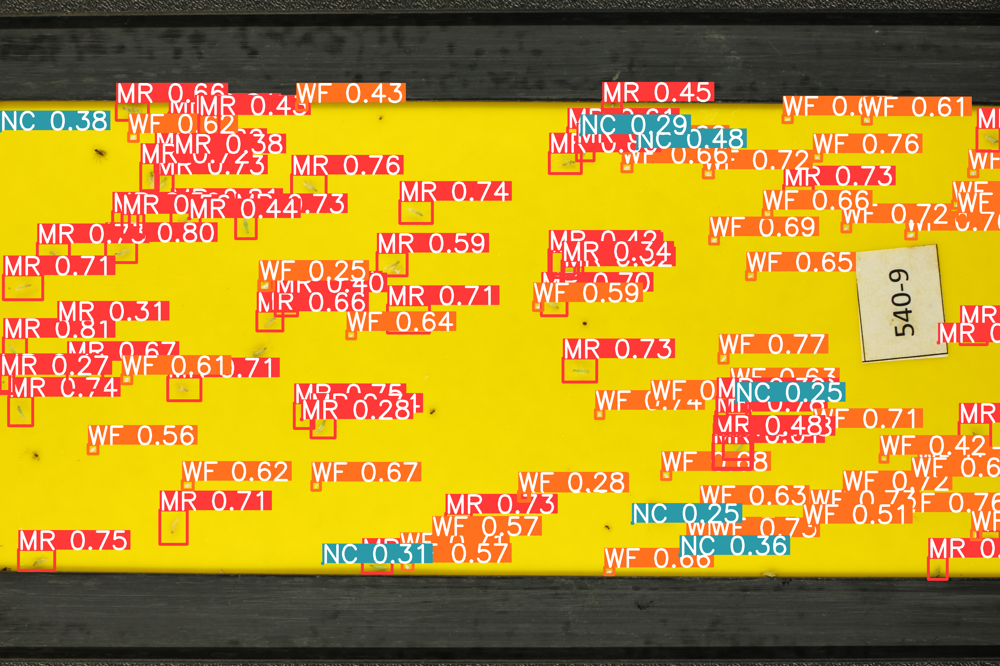

In [18]:
from IPython.display import Image, display
import os

# Đường dẫn tới ảnh đã được SAHI xử lý và vẽ box
img_path = "/kaggle/working/runs/sahi/sahi_predict/visuals/1260.png"  # thay bằng tên ảnh thực tế

if os.path.exists(img_path):
    print(f"📷 Hiển thị ảnh đã xử lý: {os.path.basename(img_path)}")
    display(Image(filename=img_path))
else:
    print("❌ Ảnh không tồn tại. Kiểm tra lại tên và đường dẫn.")


📷 Hiển thị ảnh đã xử lý: confusion_matrix.png


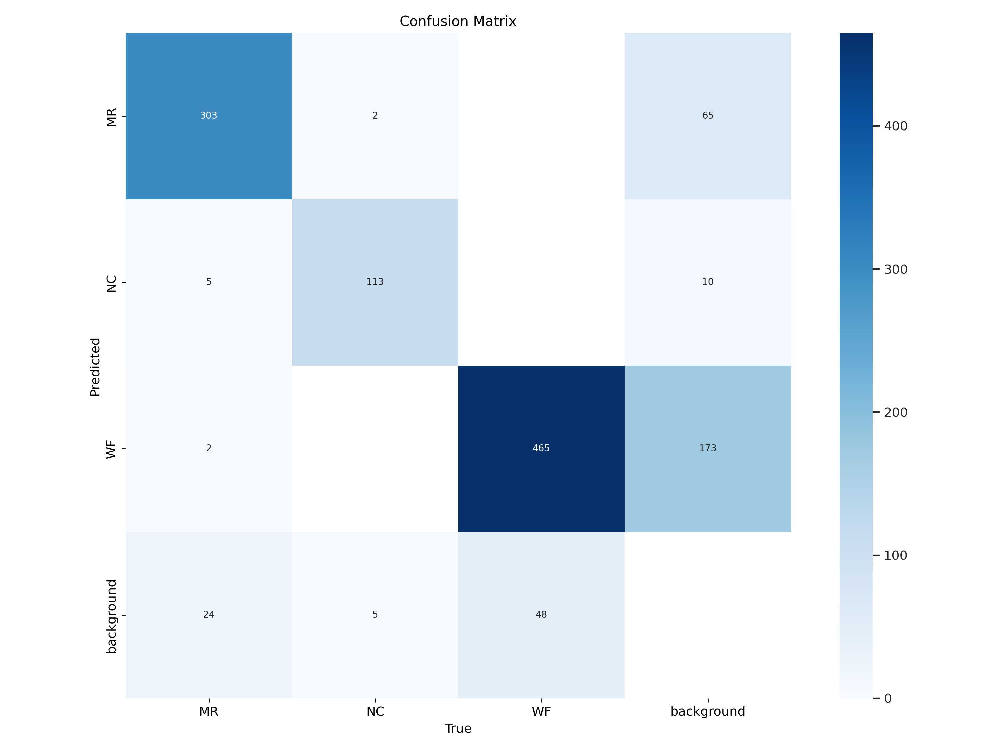

In [29]:
from IPython.display import Image, display
import os

# Đường dẫn tới ảnh đã được SAHI xử lý và vẽ box
img_path = "/kaggle/working/runs/detect/val2/confusion_matrix.png"  # thay bằng tên ảnh thực tế

if os.path.exists(img_path):
    print(f"📷 Hiển thị ảnh đã xử lý: {os.path.basename(img_path)}")
    display(Image(filename=img_path))
else:
    print("❌ Ảnh không tồn tại. Kiểm tra lại tên và đường dẫn.")
